predicted boundary:


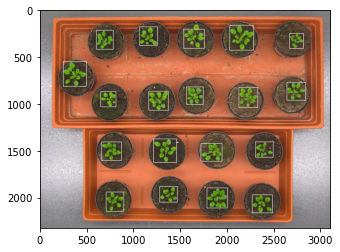

predicted boundary:


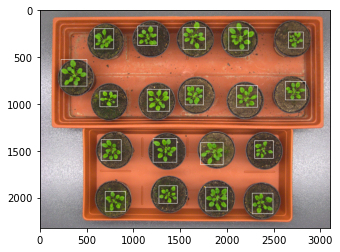

predicted boundary:


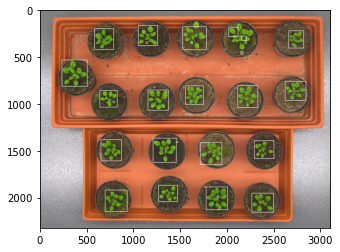

predicted boundary:


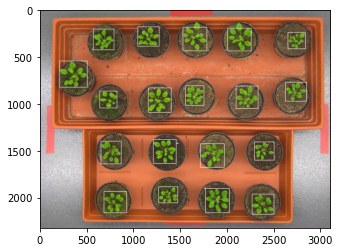

predicted boundary:


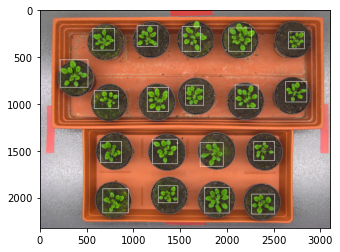

predicted boundary:


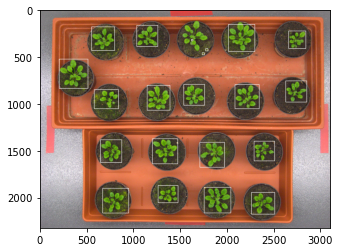

predicted boundary:


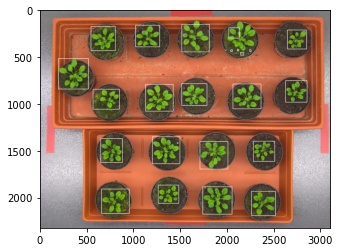

predicted boundary:


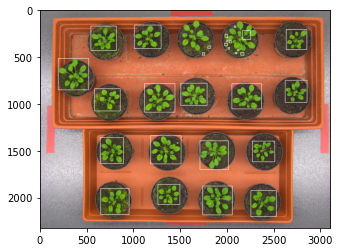

predicted boundary:


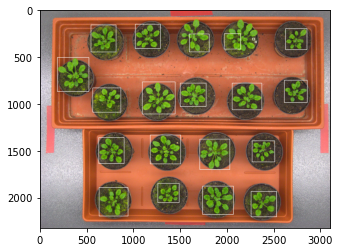

predicted boundary:


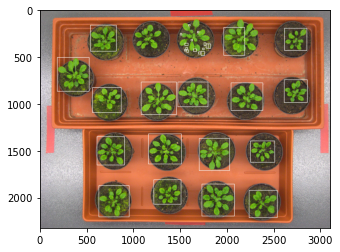

predicted boundary:


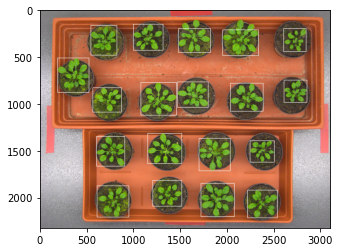

predicted boundary:


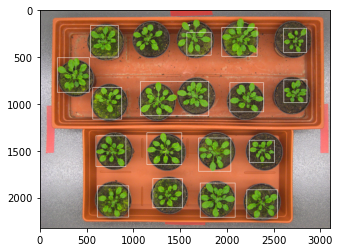

predicted boundary:


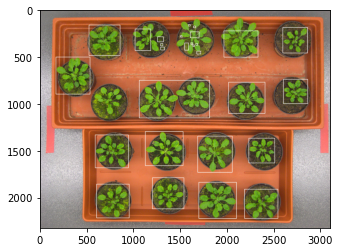

predicted boundary:


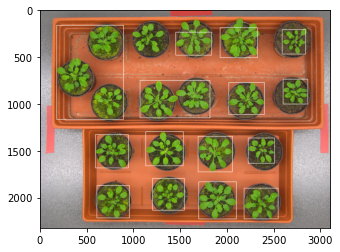

predicted boundary:


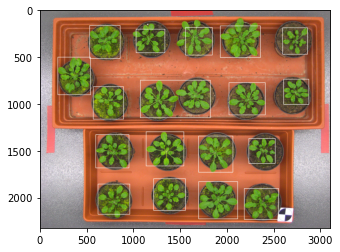

predicted boundary:


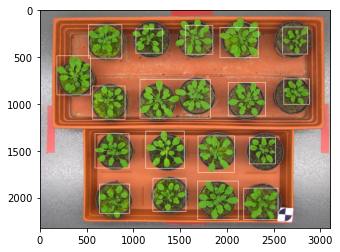

predicted boundary:


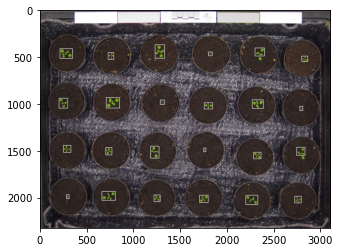

predicted boundary:


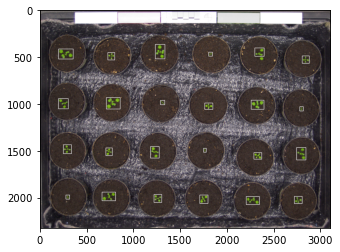

predicted boundary:


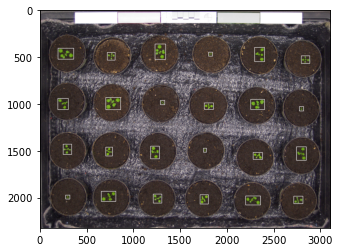

predicted boundary:


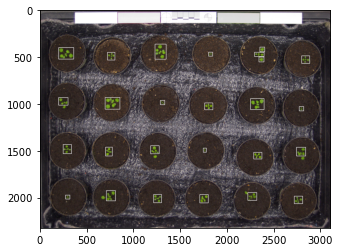

predicted boundary:


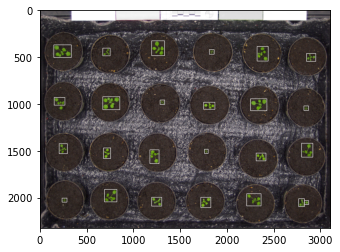

predicted boundary:


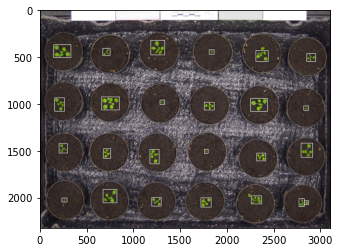

predicted boundary:


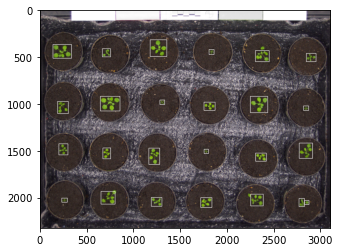

predicted boundary:


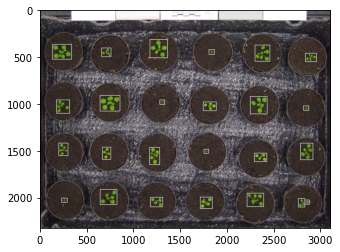

predicted boundary:


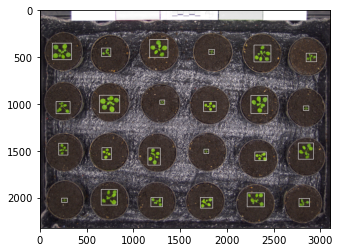

predicted boundary:


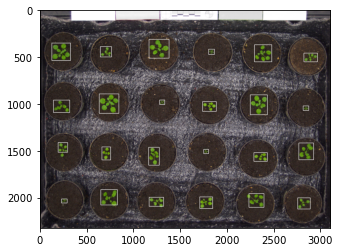

predicted boundary:


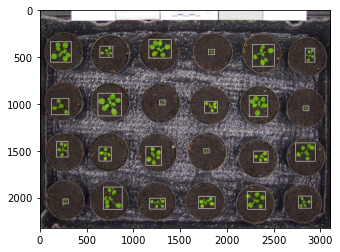

predicted boundary:


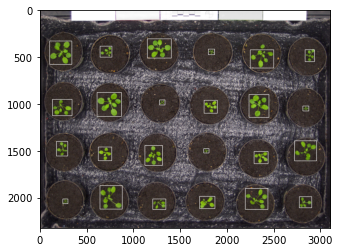

predicted boundary:


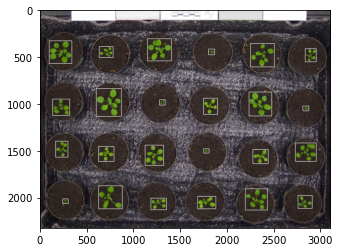

predicted boundary:


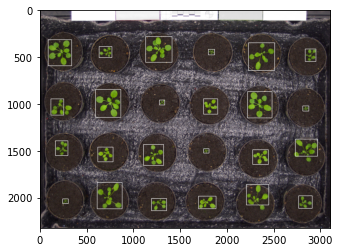

predicted boundary:


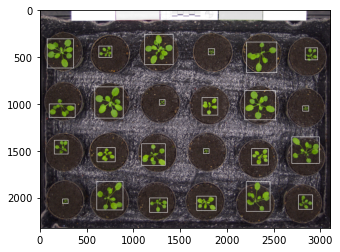

predicted boundary:


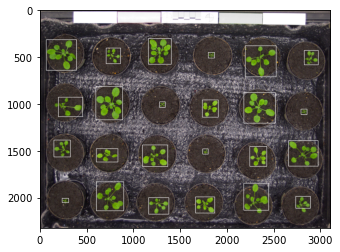

predicted boundary:


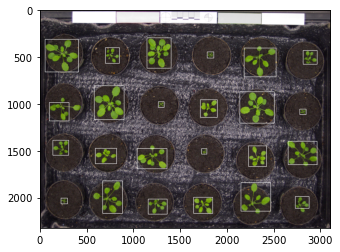

predicted boundary:


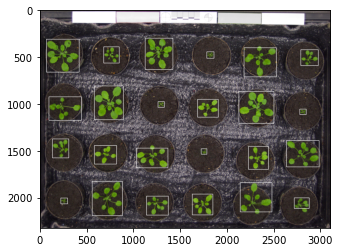

predicted boundary:


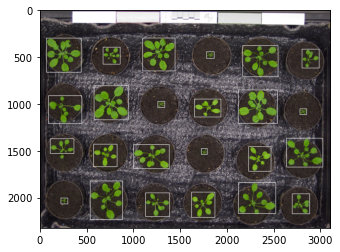

predicted boundary:


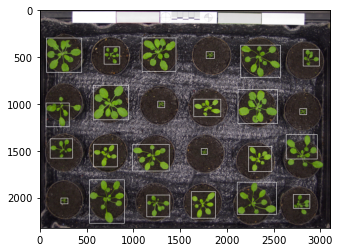

predicted boundary:


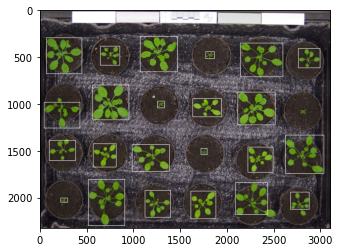

predicted boundary:


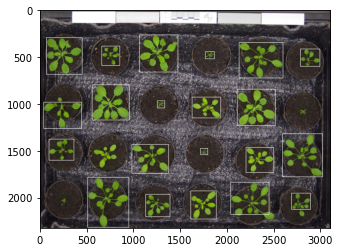

predicted boundary:


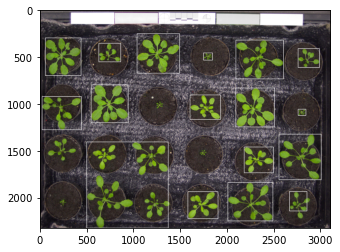

predicted boundary:


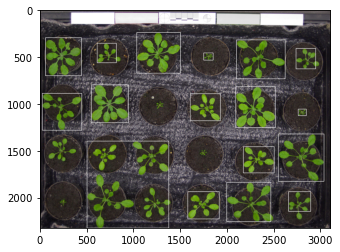

predicted boundary:


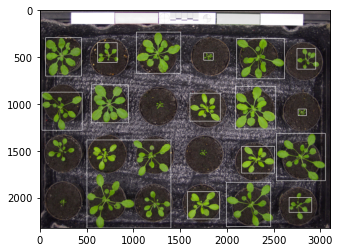

predicted boundary:


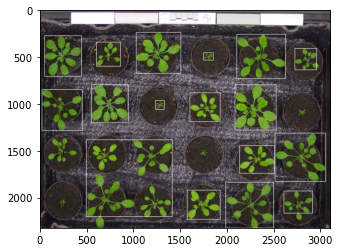

predicted boundary:


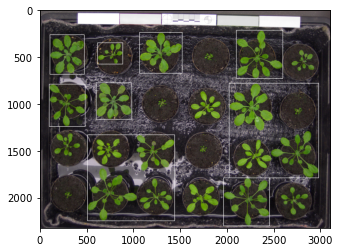

predicted boundary:


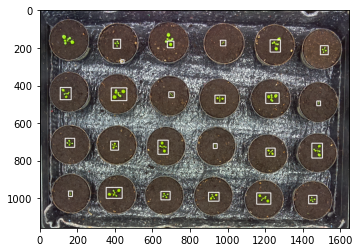

predicted boundary:


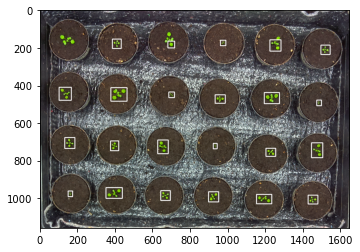

predicted boundary:


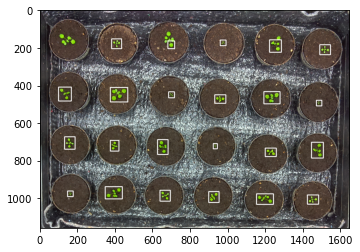

predicted boundary:


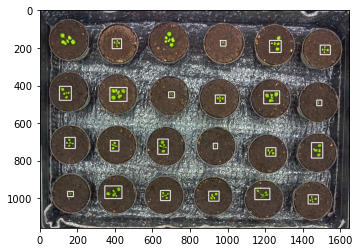

predicted boundary:


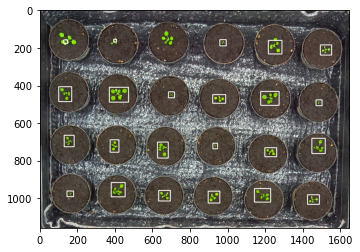

predicted boundary:


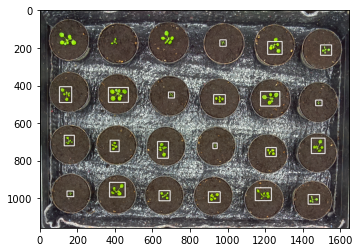

predicted boundary:


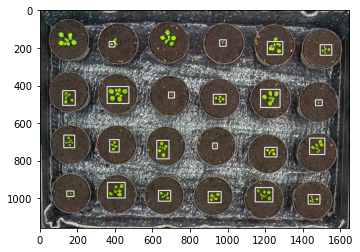

predicted boundary:


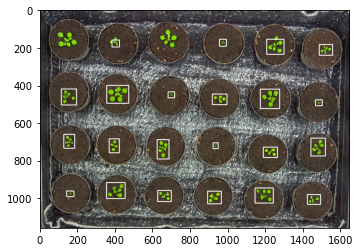

predicted boundary:


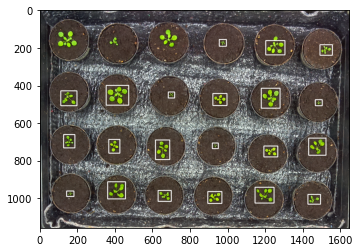

predicted boundary:


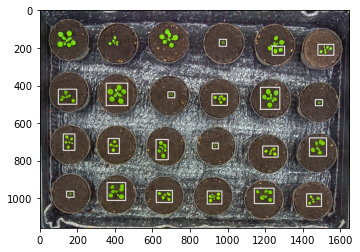

predicted boundary:


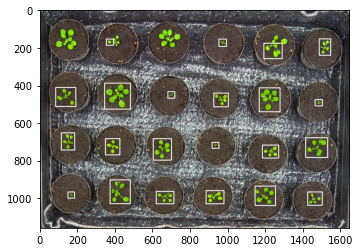

predicted boundary:


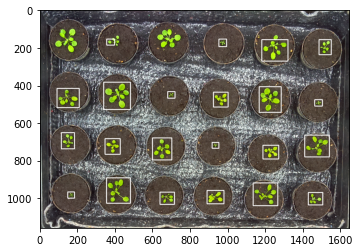

predicted boundary:


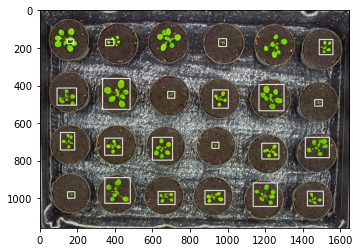

predicted boundary:


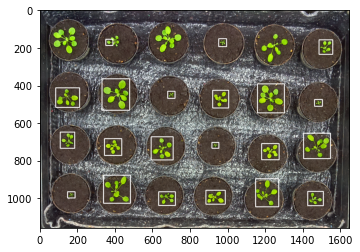

predicted boundary:


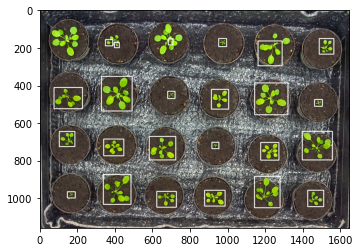

predicted boundary:


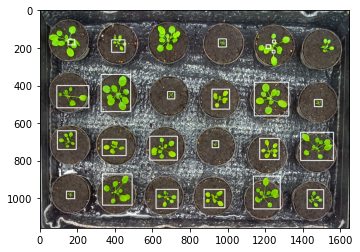

predicted boundary:


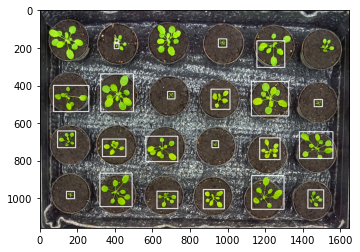

predicted boundary:


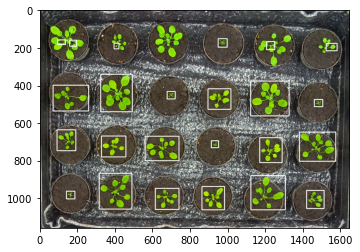

predicted boundary:


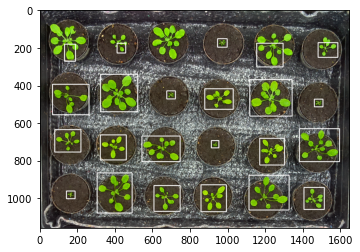

predicted boundary:


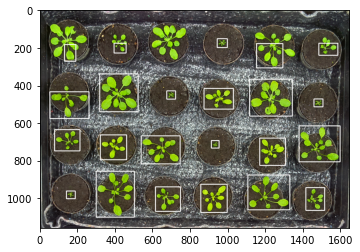

predicted boundary:


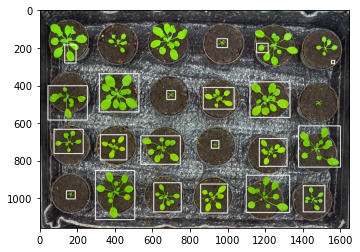

predicted boundary:


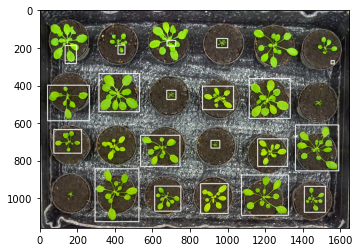

predicted boundary:


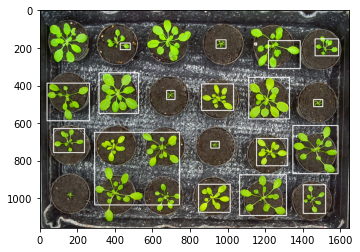

predicted boundary:


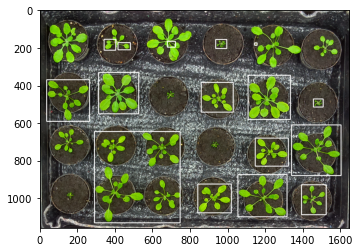

predicted boundary:


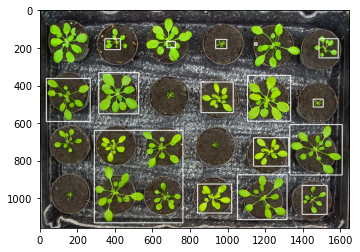

predicted boundary:


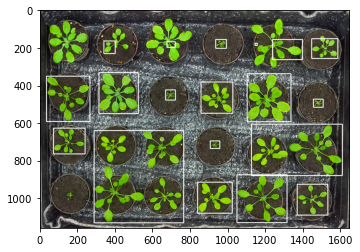

predicted boundary:


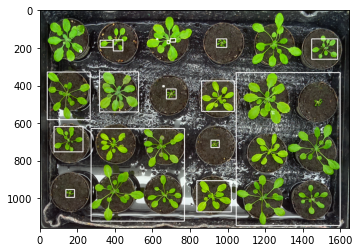

predicted number of plants:[19, 19, 21, 19, 19, 21, 23, 29, 21, 32, 19, 18, 28, 15, 19, 18, 24, 24, 24, 26, 25, 25, 25, 25, 24, 24, 25, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 21, 18, 18, 17, 17, 9, 24, 23, 23, 22, 23, 21, 22, 22, 21, 21, 22, 22, 22, 21, 24, 24, 22, 24, 23, 23, 21, 20, 19, 16, 16, 19, 19]
actual number of plants:[19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24]
average precision:0.8924812030075188


In [1]:
import numpy as np
import cv2
from matplotlib import pyplot as plt
import csv
import glob, os
    
def process(im, boxes):
    image = cv2.imread(im)
    #print("original")
    #plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    #plt.show()
    imageO = np.copy(image)


    #LAB
    LAB = cv2.cvtColor(image, cv2.COLOR_RGB2LAB)
    lower_green = np.array([1,1,80])
    upper_green = np.array([255,100,217])
    mask = cv2.inRange(LAB, lower_green, upper_green)
    mask = cv2.medianBlur(mask,3)
    #print("mask")
    #plt.imshow(mask, cmap=plt.cm.gray)
    #plt.show()

    mask2 = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    mask2[mask2 <= 255] = 0

    #rects = []
    corners = []
    count = 500
    fin = 0
    for a in range(8):
        if (fin):
            break
        if a > 0:
            gray = image
        if a == 0:
            gray = mask

        image = np.copy(mask2)
        edged = cv2.Canny(gray, 30, 200)

        contours, hierarchy = cv2.findContours(edged,  
            cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE) 



        rects = []
        for cnt in contours:
            x,y,w,h = cv2.boundingRect(cnt)
            if(y > 150 and y < 2100):
                rects.append([x, y, w, h])
                rects.append([x, y, w, h])
        rects,weights = cv2.groupRectangles(rects, 1, 0.1*a)#(0.1*a)
        count = len(rects)
        #print("Number of Contours after grouping = " + str(count)) 
        for rec in rects:
            cv2.rectangle(image,(rec[0],rec[1]),(rec[0]+rec[2],rec[1]+rec[3]),255,-1)
            if (a == 7 or count < 20):
                #print(rec[0],rec[1],rec[0]+rec[2],rec[1]+rec[3])
                x = [rec[0],rec[1],rec[0]+rec[2],rec[1]+rec[3]]
                corners.append(x)
                cv2.rectangle(imageO,(rec[0],rec[1]),(rec[0]+rec[2],rec[1]+rec[3]),(255,255,255),4)
                fin = 1
        #plt.imshow(image, cmap=plt.cm.gray)
        #plt.show()
        
    #uncomment to show image with boundaries
    print("predicted boundary:")
    plt.imshow(cv2.cvtColor(imageO, cv2.COLOR_RGB2BGR))
    plt.show()
    
    
    included_cols = [0, 1, 4, 5]
    content = []
    rows = 0
    with open(boxes, newline='') as f:
        reader = csv.reader(f)
        rows = sum(1 for line in reader)
        for row in reader:
            x = [int(row[0]),int(row[1]),int(row[4]),int(row[5])]
            content.append(x)
    return len(corners), rows



f1 = []
b1 = []
r = []
c = []

cwd = os.getcwd() 

os.chdir("Tray/Ara2012/")
for file in glob.glob("*_rgb.png"):
    f1.append(file)
for file2 in glob.glob("*_bbox.csv"):
    b1.append(file2)
    
for x in range(len(f1)):
    r1, c1 = process(f1[x],b1[x])
    r.append(r1)
    c.append(c1)
f1 = []
b1 = []    
os.chdir(cwd)

os.chdir("Tray/Ara2013-Canon/")
for file in glob.glob("*_rgb.png"):
    f1.append(file)
for file2 in glob.glob("*_bbox.csv"):
    b1.append(file2)
    
for x in range(len(f1)):
    r1, c1 = process(f1[x],b1[x])
    r.append(r1)
    c.append(c1)
f1 = []
b1 = []

os.chdir(cwd)

os.chdir("Tray/Ara2013-RPi/")
for file in glob.glob("*_rgb.png"):
    f1.append(file)
for file2 in glob.glob("*_bbox.csv"):
    b1.append(file2)
    
for x in range(len(f1)):
    r1, c1 = process(f1[x],b1[x])
    r.append(r1)
    c.append(c1)
os.chdir(cwd)




print("predicted number of plants:",end = "")
print(r)
print("actual number of plants:",end = "")
print(c)
p = []
for x in range(70):
    p.append(1-((abs(c[x]-r[x]))/(c[x])))
print("average precision:",end = "")
print(np.mean(p))